In [1]:
import gensim
import requests
import os
import networkx as nx
from networkx.algorithms import community
import matplotlib.pyplot as plt
from matplotlib import style
import seaborn as sns
style.use('ggplot') 

In [2]:
def get_model(url):
    """скачивает файл модели, если он еще не скачан, в рабочую директорию, и возвращает загруженную из него модель"""
    name = url.split('/')[-1]
    if not os.path.exists(os.getcwd() + '\\' + name):
        file = requests.get(url, allow_redirects=True)
        with open(name, 'wb') as f:
            f.write(file.content)
    if name.endswith('.vec.gz'):
        model = gensim.models.KeyedVectors.load_word2vec_format(name, binary=False, limit=500000)
    elif m.endswith('.bin.gz'):
        model = gensim.models.KeyedVectors.load_word2vec_format(name, binary=True, limit=500000)
    else:
        model = gensim.models.KeyedVectors.load(name, limit=500000)
    return model

In [3]:
def build_field(sample): 
    """находит соседей слов из заданного списка и добавляет в список поля при условии достаточной косинусной близости"""
    for word in sample:
        for i in model.most_similar(positive=[word], topn=10):
            if i[0] not in field and i[0].endswith("_NOUN") and model.similarity(word, i[0]) >= 0.5:
                field.append(i[0])

In [4]:
def create_graph(words):
    """создает граф, проходя по списку поля и связывая ребрами все пары слов с достаточной косинусной близостью"""
    G = nx.Graph()
    G.add_nodes_from(words, labels=[word[:-5] for word in words])
    for i, word in enumerate(words):
        for pair in words[i+1:]:
            sim = model.similarity(word, pair)
            if sim >= 0.5:
                G.add_edge(word, pair, weight=sim)
    return G

In [5]:
def count_graph(graph):
    """считает разные метрики для графа, возвращает одну для дальнейшего учета в визуализации"""
    print('Узлов в графе:', len(graph.nodes()))
    
    degree = nx.degree_centrality(graph)
    top_degree = sorted(degree, key=degree.get, reverse=True)
    print('Узлы с наибольшей degree centrality:', ", ".join(top_degree[:3]))
    
    betweenness = nx.betweenness_centrality(graph)
    top_betweenness = sorted(betweenness, key=betweenness.get, reverse=True)
    print('Узлы с наибольшей betweenness centrality:', ", ".join(top_betweenness[:3]))

    closeness = nx.closeness_centrality(graph)
    top_closeness = sorted(closeness, key=closeness.get, reverse=True)
    print('Узлы с наибольшей closeness centrality:', ", ".join(top_closeness[:3]))
    
    eigen = nx.eigenvector_centrality(graph)
    top_eigen = sorted(eigen, key=eigen.get, reverse=True)
    print('Узлы с наибольшей eigencentrality:', ", ".join(top_eigen[:3]))
    
    print('Плотность графа:', nx.density(graph))
    if nx.is_connected(graph):
        print('Радиус графа:', nx.radius(graph))
        print('Диаметр графа:', nx.diameter(graph))
    print('Коэффициент кластеризации графа:', nx.average_clustering(graph))
    print('Коэффициент ассортативности графа:', nx.degree_pearson_correlation_coefficient(graph)) 
    
    return closeness

In [6]:
def show_graph(graph, metric):
    """выводит граф на экран"""            
    plt.figure(figsize=(40,40), dpi=180)
    pos=nx.spring_layout(graph)        
    nx.draw_networkx_edges(graph, pos, edge_color='teal')
    nx.draw_networkx_labels(graph, pos, font_size=20)
    for word in graph.nodes():
        size = 1000 * metric[word]
        nx.draw_networkx_nodes(graph, pos, nodes=[word], node_color='blue', alpha=0.5, node_size=size) 
        
    plt.axis('off')
    plt.show()

Узлов в графе: 38
Узлы с наибольшей degree centrality: джезво_NOUN, хачапури_NOUN, кастрюля_NOUN
Узлы с наибольшей betweenness centrality: джезво_NOUN, хачапури_NOUN, сковородка_NOUN
Узлы с наибольшей closeness centrality: джезво_NOUN, хачапури_NOUN, кастрюля_NOUN
Узлы с наибольшей eigencentrality: джезво_NOUN, хачапури_NOUN, противне_NOUN
Плотность графа: 0.8762446657183499
Радиус графа: 1
Диаметр графа: 2
Коэффициент кластеризации графа: 0.9200169822250884
Коэффициент ассортативности графа: -0.09691879314850638


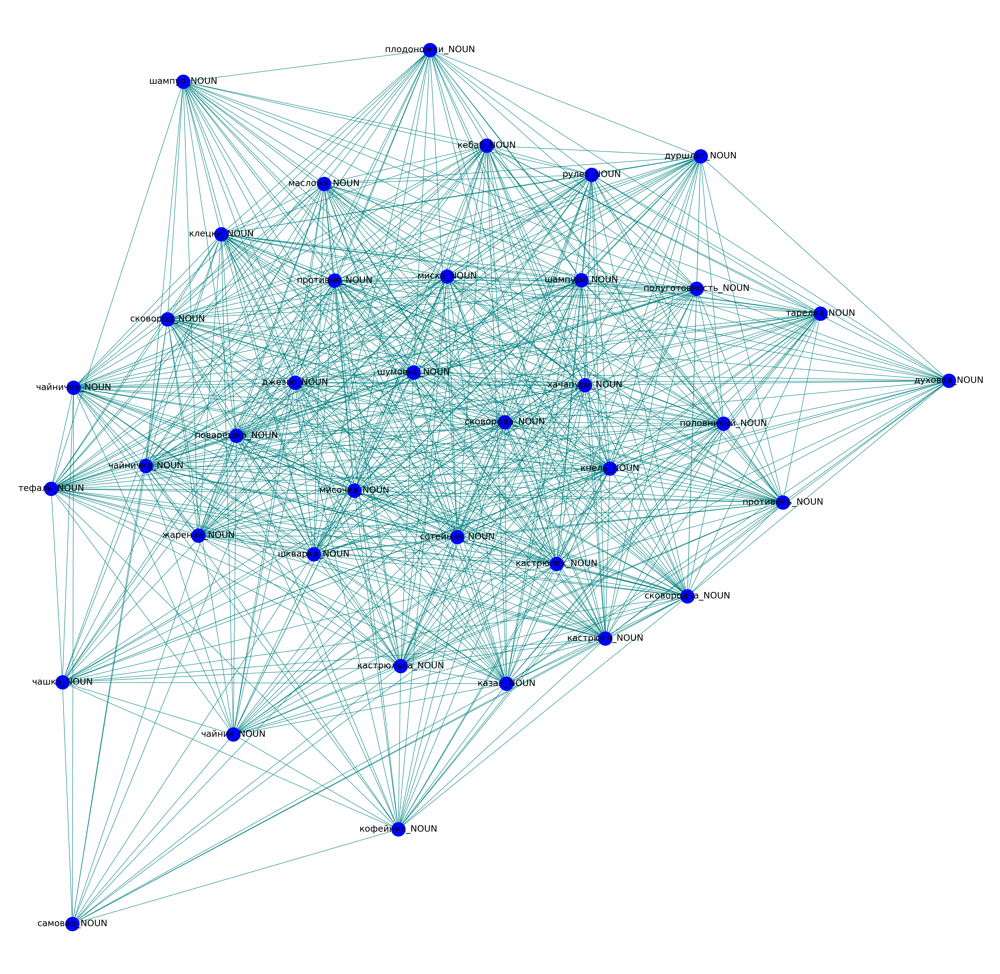

In [7]:
url = "https://rusvectores.org/static/models/rusvectores4/RNC/ruscorpora_upos_skipgram_300_5_2018.vec.gz"
model = get_model(url)
start_words = ("кастрюля_NOUN", "сковородка_NOUN")
field = list(start_words)
build_field(start_words) # нахождение соседей первого порядка
build_field(tuple(field[len(start_words):])) # нахождение соседей второго порядка
fieldgraph = create_graph(field)

metric = count_graph(fieldgraph)
show_graph(fieldgraph, metric)